In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/DD.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/DD.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/DD'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.d...,1176,1323,863,968,0.997942,False,3,DD
1,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.d...,1190,1342,1393,1503,0.991382,False,3,DD
2,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.d...,1199,1346,880,986,0.998232,False,3,DD
3,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.d...,1207,1356,1408,1517,0.996388,False,3,DD
4,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.33333.1.20230127.100132.0.2.1195.dcm,1-22101025,1.2.276.0.95.33333.1.20230127.100132.0.2.1195....,1235,1452,2014,2171,0.999170,False,3,DD
...,...,...,...,...,...,...,...,...,...,...,...,...
213,P:/CoxaAI/Sortering 1/DD,1.3.51.0.7.13253297091.53451.32577.40217.19319...,1-23013401,1.3.51.0.7.13253297091.53451.32577.40217.19319...,1661,1909,1867,2045,0.992767,False,3,DD
214,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.d...,940,1070,575,668,0.995498,False,3,DD
215,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.d...,935,1065,1054,1147,0.977024,False,3,DD
216,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93855.0.2.8747.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93855.0.2.8747.d...,866,997,564,658,0.997312,False,3,DD


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([143], dtype='int64')

Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

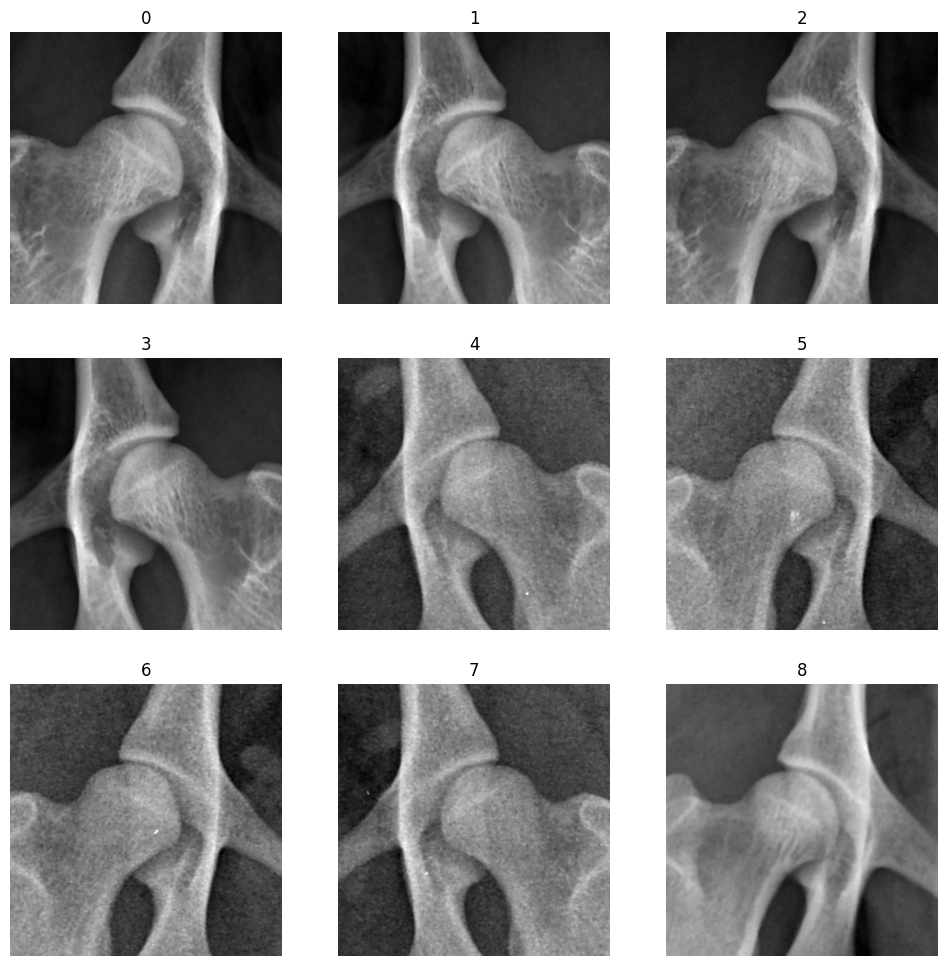

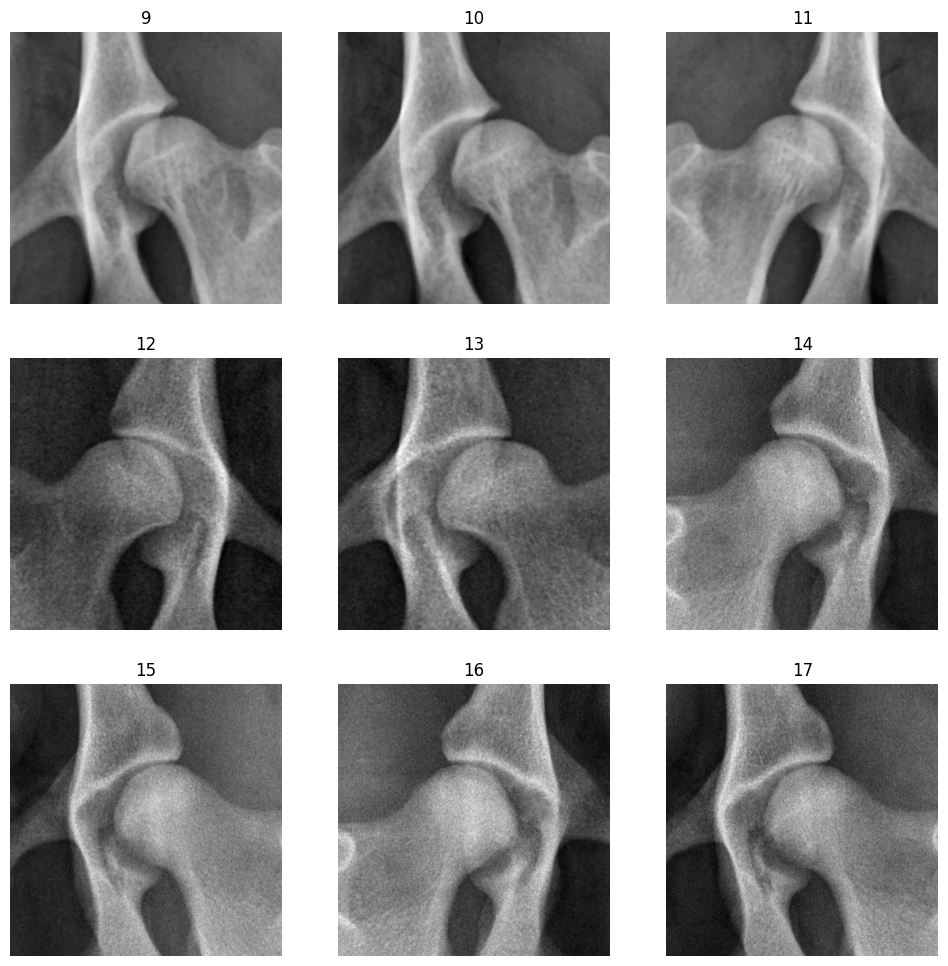

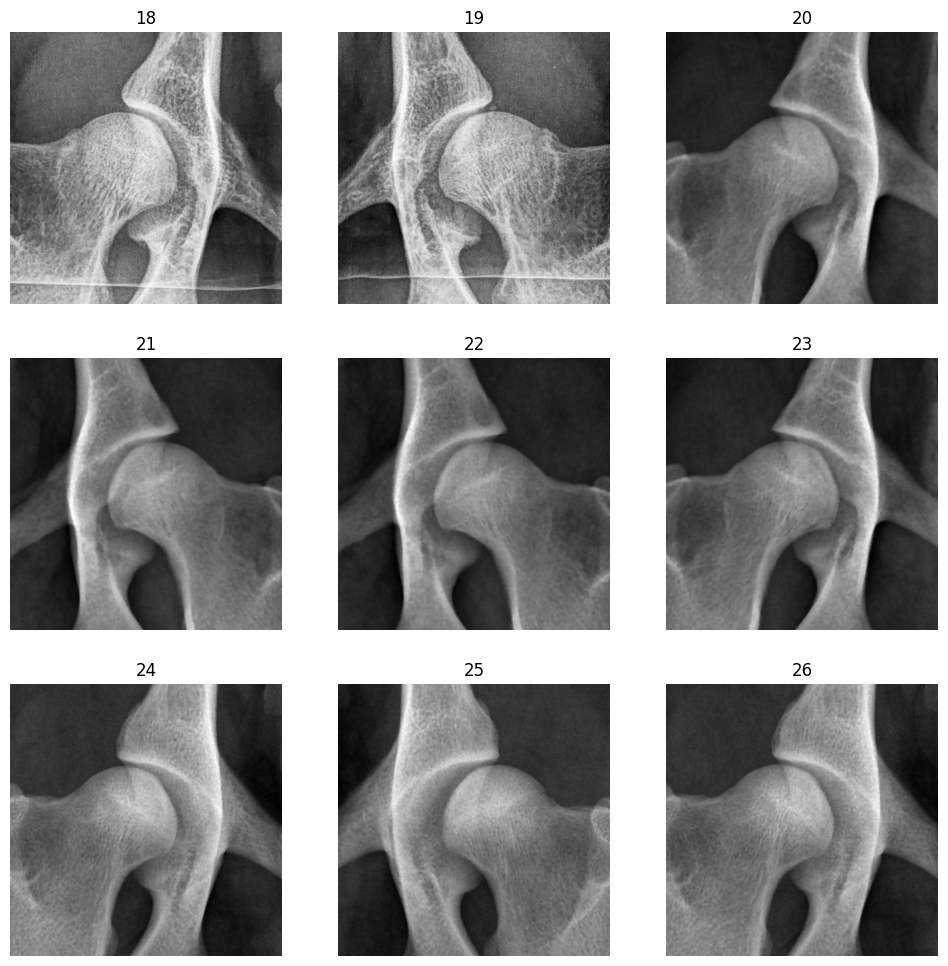

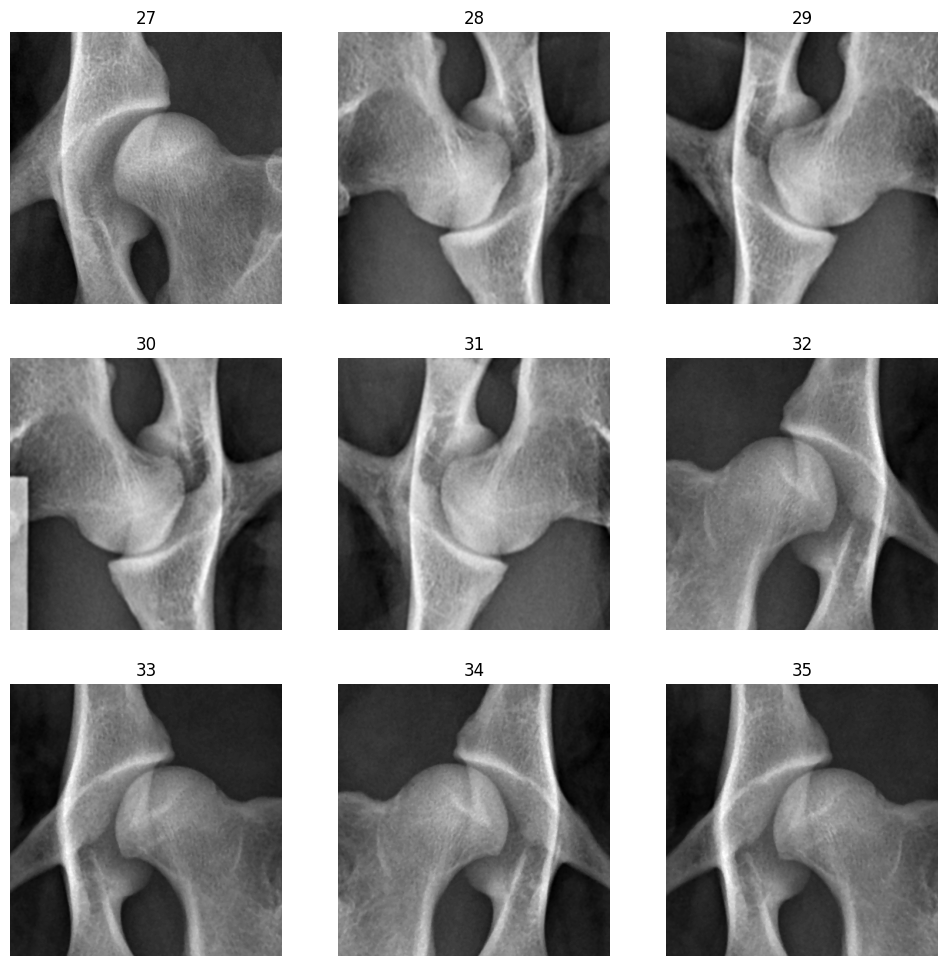

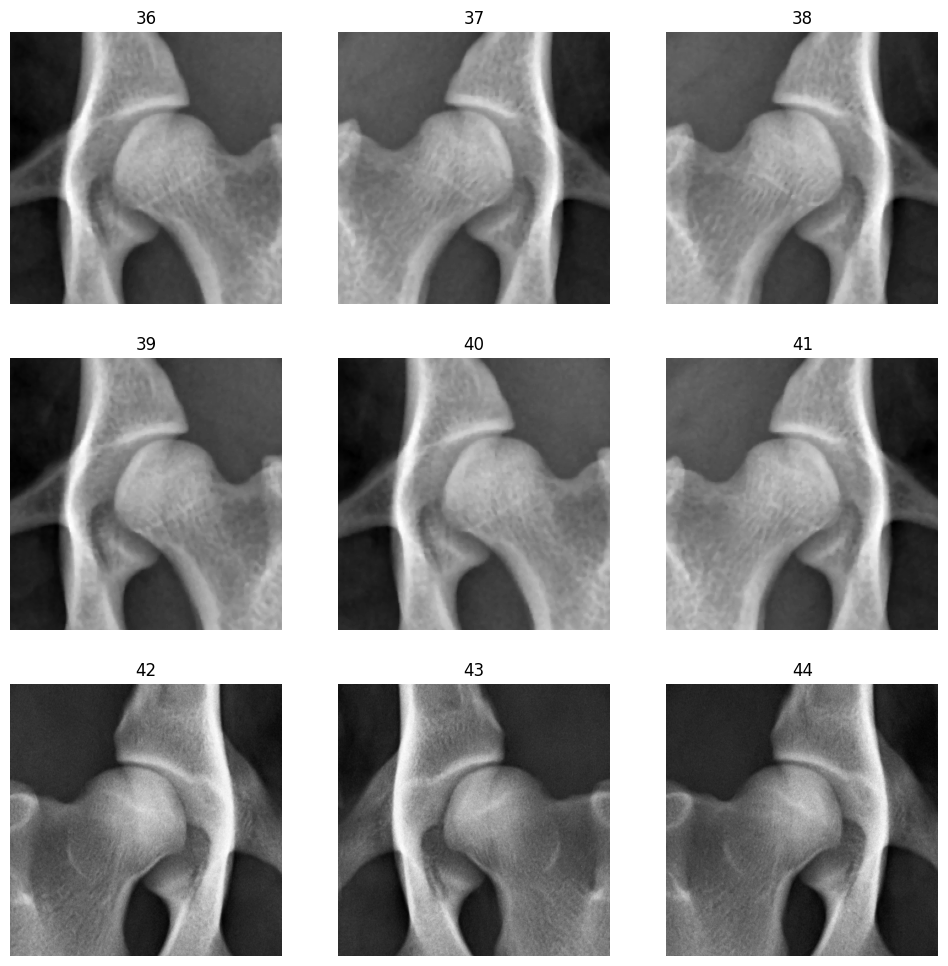

...

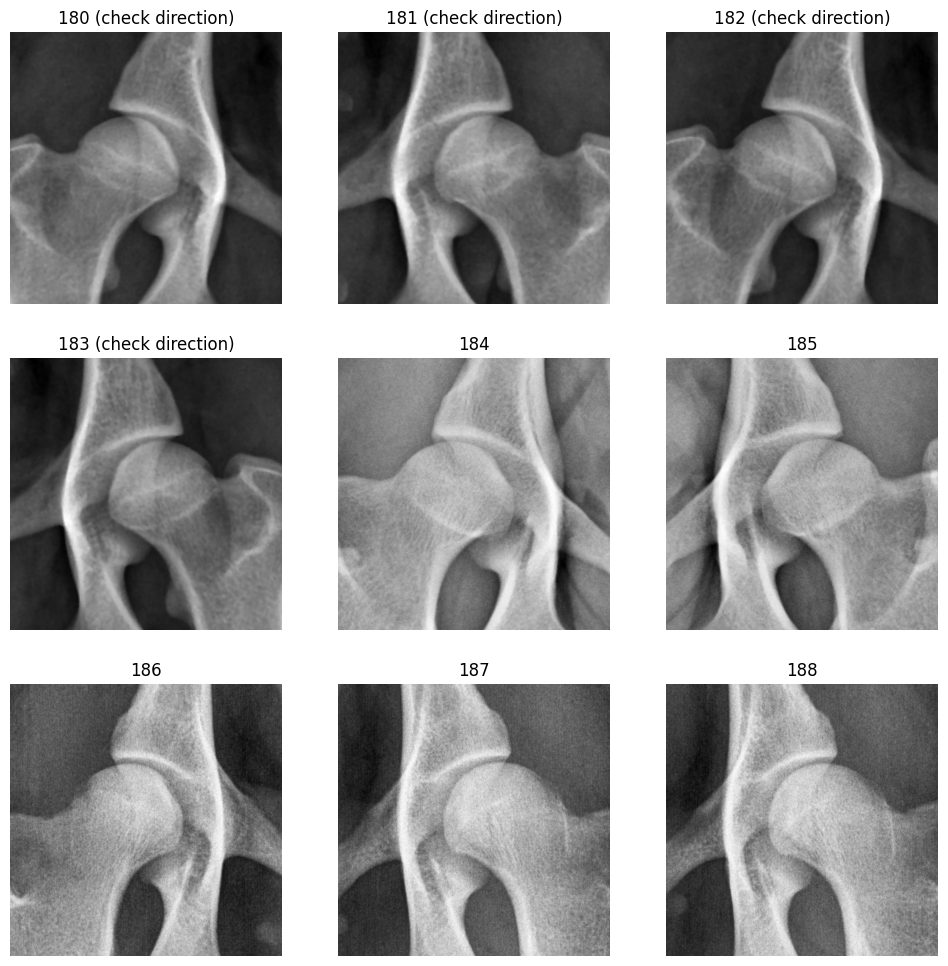

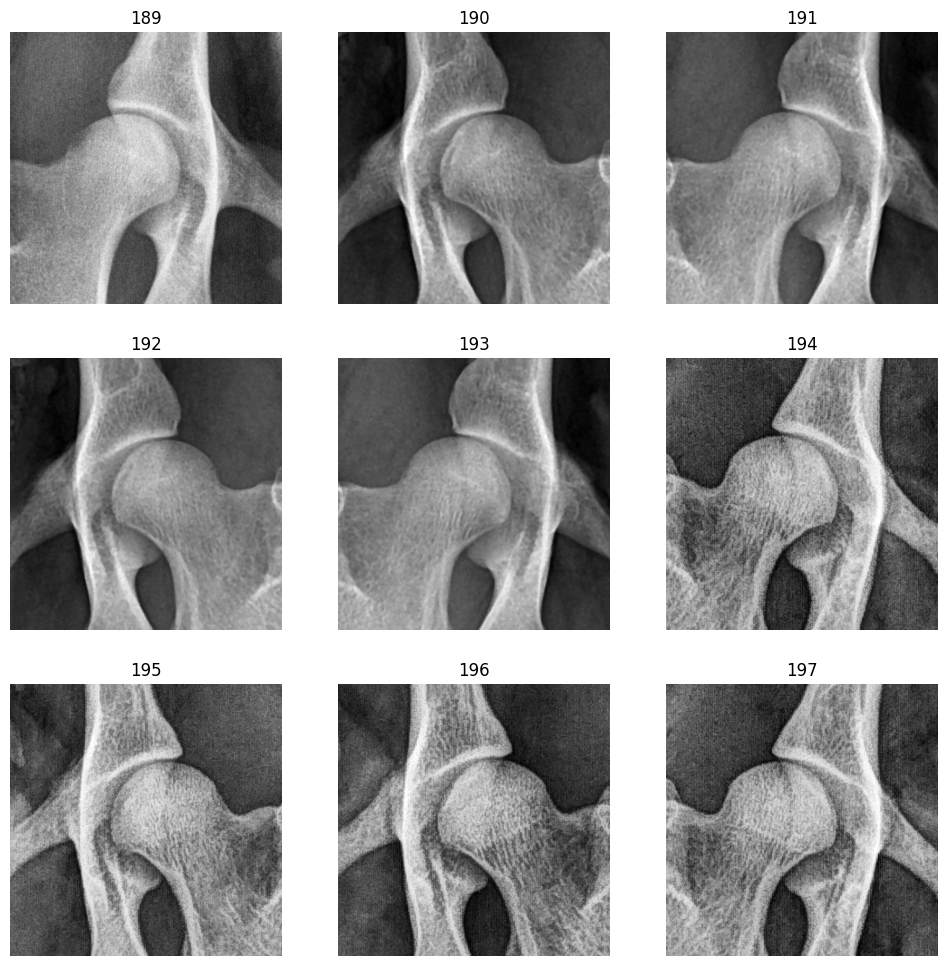

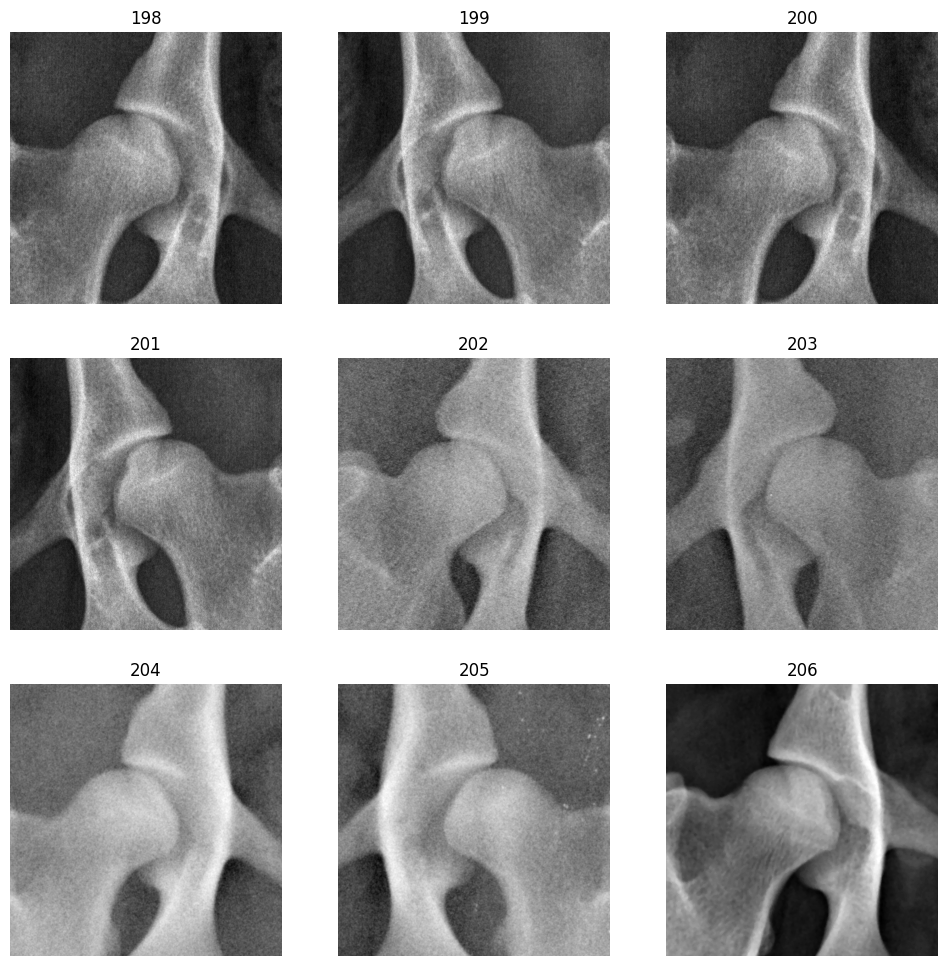

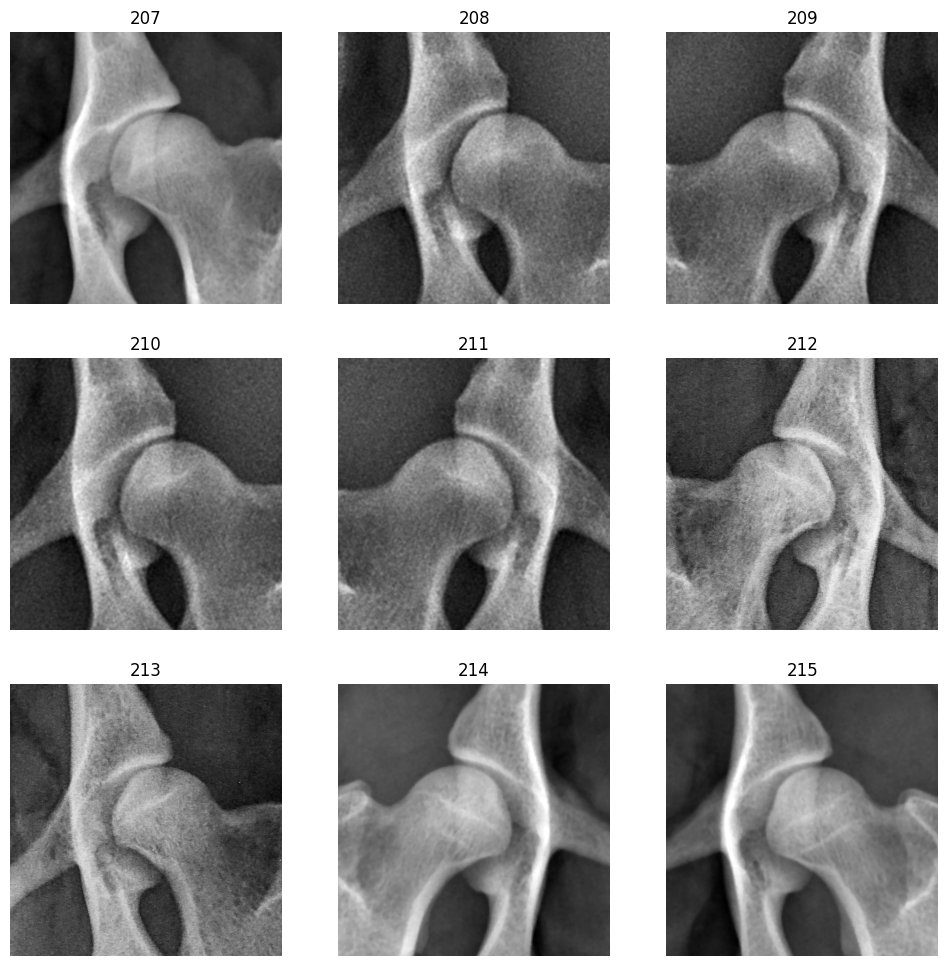

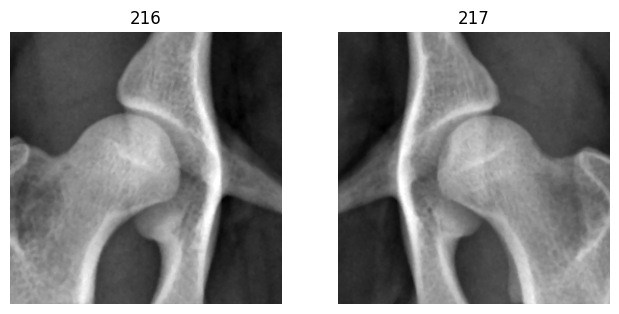

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [28, 29, 30, 31]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = []
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.d...,1176,1323,863,968,0.997942,False,3,DD,False
1,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93033.0.2.9974.d...,1190,1342,1393,1503,0.991382,False,3,DD,False
2,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.d...,1199,1346,880,986,0.998232,False,3,DD,False
3,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.dcm,1-22095607,1.2.276.0.95.31800.1.20230207.93130.0.2.9963.d...,1207,1356,1408,1517,0.996388,False,3,DD,False
4,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.33333.1.20230127.100132.0.2.1195.dcm,1-22101025,1.2.276.0.95.33333.1.20230127.100132.0.2.1195....,1235,1452,2014,2171,0.999170,False,3,DD,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
213,P:/CoxaAI/Sortering 1/DD,1.3.51.0.7.13253297091.53451.32577.40217.19319...,1-23013401,1.3.51.0.7.13253297091.53451.32577.40217.19319...,1661,1909,1867,2045,0.992767,False,3,DD,False
214,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.d...,940,1070,575,668,0.995498,False,3,DD,False
215,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93714.0.2.8745.d...,935,1065,1054,1147,0.977024,False,3,DD,False
216,P:/CoxaAI/Sortering 1/DD,1.2.276.0.95.32595.1.20230214.93855.0.2.8747.dcm,1-23014243,1.2.276.0.95.32595.1.20230214.93855.0.2.8747.d...,866,997,564,658,0.997312,False,3,DD,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]
print(new_detection_df.shape)

(218, 13)


In [13]:
new_detection_df.to_csv(filename_clean, index=False)

In [14]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped


In [15]:
detection_df[detection_df.index==143]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
143,P:/CoxaAI/Sortering 1/DD,1.2.276.0.7230010.3.0.3.5.1.13509135.381901640...,1-23006850,1.2.276.0.7230010.3.0.3.5.1.13509135.381901640...,902,1134,1573,1744,0.402502,False,3,DD,False
